# Network Wrapping

Following the outputs of the architecture-design and detector-training notebooks, this notebook wraps the resulted network in order to produce Regions-Of-Interest (ROI) for detection.

This notebook is partially based on [this](https://medium.com/@fractaldle/guide-to-build-faster-rcnn-in-pytorch-95b10c273439) detailed tutorial of Faster-RCNN implementation.
Much of the relevant code is implemented in DetectorNetwork.py and only called here.

Note that in the scope of this project, the ROI provide the final prediction, and not merely initial "selective search" as in Faster-RCNN.

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import DetectorNetwork as dn

In [3]:
import os, sys, time, datetime, random
from pathlib import Path
from warnings import warn
from tqdm import tqdm, tnrange, tqdm_notebook
import pickle as pkl
import gc

import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
from collections import Counter, OrderedDict
import cv2
from PIL import Image

In [4]:
import torch as t
from torch import nn
from torch.nn import functional as F
from torch.autograd import Variable
import torchvision as tv

In [5]:
mpl.rcParams.update({'font.size': 14})
CMAP = plt.get_cmap('rainbow')

### Initialization

In [6]:
files, images, W, H, _ = dn.get_training_images(verbose=False)
inputs = dn.ims2vars(images, verbose=False)
labels, locations, anchors = dn.get_training_labels(verbose=False)
anchor_locs = dn.get_anchors_location_map(anchors)
loc_fac = dn.LocationFactory(anchors, H, W)

In [7]:
model = dn.get_trained_detector()

_______________

## ROI Proposals

Use network output to produce proposals for Regions Of Interest.
This includes several steps which are different from the steps in the context of training, e.g. eliminating low-confidence regions and highly-overlapping regions.

#### Labeled training images

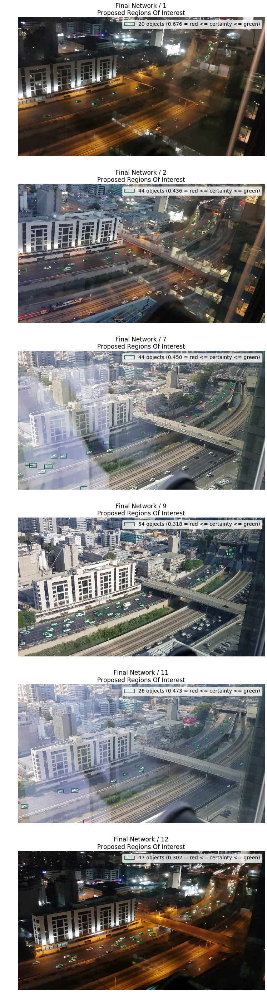

In [8]:
_, axs = plt.subplots(6,1, figsize=(18,5*10))

for ii,i in enumerate((1,2,7,9,11,12)):
    X, anchor_locs = dn.to_device(model, [inputs[i],anchor_locs])
    scores, locs = model(X, anchor_locs)
    roi, roi_scores = dn.regions_of_interest(scores.cpu(), locs.cpu(), thresh=0.3, nms_thresh=0.25,
                                             loc_fac=loc_fac, verbose=False)
    dn.clean_device([X,scores,locs])
    dn.show_roi(roi_scores, roi, images[i], ax=axs[ii], title=f'Final Network / {i:d}')

#### New frames from all the videos

In [9]:
VIDEOS_PATH = Path(r'D:\Media\Videos\Ayalon')
N_VIDEOS = 15
FRAMES_PER_VIDEO = 1

In [10]:
# sample videos
all_videos = [f for f in os.listdir(VIDEOS_PATH) if f.endswith('.mp4')]
sampled_videos = sorted(np.random.choice(all_videos, size=N_VIDEOS, replace=False))

In [11]:
# sample frames
frames = []
for video in sampled_videos:
    cap = cv2.VideoCapture(str(VIDEOS_PATH/video))
    n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    sampled_frames = sorted(np.random.randint(0,n_frames,FRAMES_PER_VIDEO))
    for i in sampled_frames:
        cap.set(cv2.CAP_PROP_POS_FRAMES, i)
        _, frame = cap.read()
        frames.append(frame[:,:,2::-1])

In [12]:
inputs = dn.ims2vars(frames)

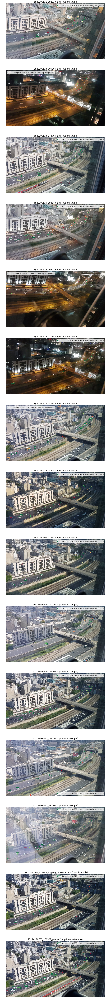

In [13]:
_, axs = plt.subplots(N_VIDEOS*FRAMES_PER_VIDEO,1, figsize=(18,N_VIDEOS*10))

for i in range(N_VIDEOS*FRAMES_PER_VIDEO):
    X, anchor_locs = dn.to_device(model, [inputs[i],anchor_locs])
    scores, locs = model(X, anchor_locs)
    roi, roi_scores = dn.regions_of_interest(scores.cpu(), locs.cpu(), thresh=0.3, nms_thresh=0.25,
                                             loc_fac=loc_fac, verbose=False)
    dn.clean_device([X,scores,locs])
    dn.show_roi(roi_scores, roi, frames[i], ax=axs[i], title=f'{i+1:d}) {sampled_videos[i]:s} (out-of-sample)', inner_title='')